# Podobnost hlasování

V následující analýze se budeme věnovat otázce, jak se vzájemně podobá hlasování poslanců.

## Nastavení prostředí

In [1]:
# Specifické příkazy pro prostředí Google Colab
if 'google.colab' in str(get_ipython()):
        import os, sys
        os.chdir('/content')
        # Stažení knihovny
        ! ls parlamentikon || git clone "https://github.com/parlamentikon/parlamentikon.git" --branch main
        os.chdir('/content/parlamentikon/notebooks')

In [2]:
instalace_zavislosti = True
if instalace_zavislosti:
    ! pip install -r ../requirements.txt 1>/dev/null

In [3]:
instalace_knihovny = False
if instalace_knihovny:
    ! pip install ..  1>/dev/null
else:
    # Přidání cesty pro lokální import knihovny
    import sys, os
    sys.path.insert(0, os.path.abspath('..'))

## Import knihoven

In [4]:
from datetime import datetime

import plotly.graph_objects as go

import pandas as pd
import numpy as np

In [5]:
from parlamentikon.Hlasovani import Hlasovani, ZpochybneniHlasovani, HlasovaniPoslanci
from nastav_notebook import nastav_pandas

## Parametry

In [6]:
# Data se budou pokaždé znovu stahovat z achivu PS
stahni=True

# Budeme analyzovat poslední volební období
zvolene_volebni_obdobi = None

## Načtení tabulek

In [7]:
# Načti souhrnné informace o hlasováních
h = Hlasovani(stahni=stahni, volebni_obdobi=zvolene_volebni_obdobi)
h.head(2)

2021-03-23:21:32:39 INFO     [utility.py:21] Stahuji 'https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip'.
2021-03-23:21:32:40 INFO     [utility.py:21] Stahuji 'https://www.psp.cz/eknih/cdrom/opendata/hl-2017ps.zip'.


,id_hlasovani,id_organ,schuze,cislo,bod,cas,pro,proti,zdrzel,nehlasoval,...,nazev_kratky,datum,bod__KAT,vysledek,druh_hlasovani,ma_zpochybneni,je_zmatecne,ma_stenozaznam,turn,typ
0,67018,172,1,1,3,13:53:00,191,0,5,0,...,<NA>,2017-11-20 13:53:00+01:00,normální,přijato,normální,False,True,False,<NA>,<NA>
1,67019,172,1,2,3,13:53:00,194,0,4,0,...,<NA>,2017-11-20 13:53:00+01:00,normální,přijato,normální,False,False,False,<NA>,<NA>


In [8]:
# Načti informace o zpochybnění hlasování
zph = ZpochybneniHlasovani(stahni=stahni, volebni_obdobi=zvolene_volebni_obdobi)
zph.head(2)

2021-03-23:21:32:42 INFO     [utility.py:21] Stahuji 'https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip'.
2021-03-23:21:32:42 INFO     [utility.py:21] Stahuji 'https://www.psp.cz/eknih/cdrom/opendata/hl-2017ps.zip'.
2021-03-23:21:32:45 WARNING  [Snemovna.py:149] While merging 'zpochybneni' with 'hlasovani': Dropping ['turn__hlasovani'] because of abundance.
2021-03-23:21:32:45 WARNING  [Snemovna.py:184] Pro sloupec 'je_platne' nebyla nalezena metadata!


,id_hlasovani,turn,mode,id_h2,id_h3,mode__KAT,je_platne,id_organ,schuze,cislo,...,nazev_kratky,datum,bod__KAT,vysledek,druh_hlasovani,ma_zpochybneni,je_zmatecne,ma_stenozaznam,typ__ORIG,typ
0,55680,67,0,55681,55682,žádost o opakování,True,<NA>,<NA>,<NA>,...,<NA>,NaT,<NA>,<NA>,<NA>,NaN,NaN,NaN,<NA>,<NA>
1,55664,43,0,55665,55666,žádost o opakování,True,<NA>,<NA>,<NA>,...,<NA>,NaT,<NA>,<NA>,<NA>,NaN,NaN,NaN,<NA>,<NA>


In [9]:
# Načti informace o hlasování poslanců
hp = HlasovaniPoslanci(stahni=stahni, volebni_obdobi=zvolene_volebni_obdobi)
hp.head(2)

2021-03-23:21:32:45 INFO     [utility.py:21] Stahuji 'https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip'.
2021-03-23:21:32:46 WARNING  [Snemovna.py:149] While merging 'funkce' with 'typ_funkce': Dropping ['typ_id_typ_organ__typ_funkce', 'typ_organ_obecny__typ_funkce', 'id_typ_organ__typ_funkce', 'nazev_typ_organ_cz__typ_funkce', 'nazev_typ_organ_en__typ_funkce'] because of abundance.
2021-03-23:21:32:47 INFO     [utility.py:21] Stahuji 'https://www.psp.cz/eknih/cdrom/opendata/hl-2017ps.zip'.


,id_hlasovani,nazev_dlouhy,vysledek,id_poslanec,id_osoba,pred,jmeno,prijmeni,id_klub,nazev_klub_cz,...,cas,datum,bod__KAT,druh_hlasovani,ma_zpochybneni,id_parlament,id_organ,od_klub,do_klub,je_zmatecne
index,,,,,,,,,,,,,,,,,,,,,
0,67018,Inf. o ustavení volební komise PS a volbě členů,ano,1521,5700,Mgr.,Ivan,Adamec,1295,Poslanecký klub Občanské demokratické strany,...,13:53:00,2017-11-20 13:53:00+01:00,normální,normální,False,172,172,2017-10-24 00:00:00+02:00,NaT,True
1,67018,Inf. o ustavení volební komise PS a volbě členů,ano,1522,6254,prof. MUDr.,Věra,Adámková,1292,Poslanecký klub ANO 2011,...,13:53:00,2017-11-20 13:53:00+01:00,normální,normální,False,172,172,2017-10-24 00:00:00+02:00,NaT,True


## Analýza

In [10]:
volebni_obdobi = h.volebni_obdobi
print(f"Poslanecká sněmovna bude analyzovaná pro volební období {volebni_obdobi}.")

Poslanecká sněmovna bude analyzovaná pro volební období 2017.


###  Výběr platných hlasování
Přibližná pravidla pro určení platnosti hlasování:
- Hlasování může být označeno jako zmatečné. Zmatečné hlasování je neplatné.
- Hlasování může být zpochybněno.
  - O zpochybnění se může hlasovat.
    - Pokud se o zpochybnění hlasování hlasuje a zpochybnění je přijato, dochází k opakovanému hlasování. Původní hlasování je neplatné.
      - V tabulce ZpochybněníHlasování je uveden identifikátor hlasování o zpochybnění hlasování (id_h2) a identifikátor opakovaného hlasování (id_h3).
      - Hlasování o zpochybnění hlasování lze zpochybnit.
      - Identifikátor opakovaného hlasování označuje první platné hlasování v řadě hlasování.
    - Pokud se o zpochybnění hlasování nehlasuje nebo pokud není zpochybnění hlasování přijato, je v tabulce ZpochybneniHlasování nastaveno 'pouze pro stenozáznam'. Původní hlasování zůstává platné.


In [11]:
def flatten(ary):
    return [x for l in ary for x in l]

# Hlasování o zpochybnění hlasování je možné také zkazit nebo zpochybnit.
# Mezi prvním hlasováním o zpochybnění a opakovaným hlasováním může proběhnout několik dalších zpochybněných nebo neplatných hlasování.
def fce_mezi_hlasovanim_o_zpochybneni_a_opakovanym_hlasovanim_ids(row):
    if pd.isna(row['id_h2']):
        return []
    elif pd.isna(row['id_h3']):
        return []
    else:
        return list(range(row['id_h2']+1, row['id_h3']))

zpochybneni = zph[zph.je_platne == True]

mezi_hlasovanim_o_zpochybneni_a_opakovanym_hlasovani_ids = \
    flatten(zpochybneni[zpochybneni.mode__KAT == 'žádost o opakování'].apply(fce_mezi_hlasovanim_o_zpochybneni_a_opakovanym_hlasovanim_ids, axis=1))

hlasovani_o_zpochybneni_ids = h[h.id_hlasovani.isin(zpochybneni.id_h2.unique())]

hlasovani_bez_zmatecnych_a_zpochybnenych = h[~h.je_zmatecne
                     & ~h.id_hlasovani.isin(zph[zph.mode__KAT == 'žádost o opakování'].id_hlasovani)
                     & ~h.id_hlasovani.isin(mezi_hlasovanim_o_zpochybneni_a_opakovanym_hlasovani_ids)
                     & ~h.id_hlasovani.isin(hlasovani_o_zpochybneni_ids)
]

In [12]:
hlasovani_bez_zmatecnych_a_zpochybnenych.groupby('nazev_dlouhy').size().sort_values()

nazev_dlouhy
Návrh na volbu členů DR Státního fondu dopravní infrastruktury           1
Návrh na volbu člena DR SZIF                                             1
Návrh na volbu čl. SK pro hybridní hrozby                                1
Návrh na volbu předsedy SK pro kontrolu činnosti GIBS                    1
Návrh na volbu předsedy DR SZIF                                          1
                                                                      ... 
Návrh na vyslovení souhlasu PS s prodloužením doby nouzového stavu     159
Vl.n.z. o státním rozpočtu ČR na rok 2020                              190
                                                                       228
Novela z. o evidenci tržeb - EU                                        857
Pořad schůze                                                          1336
Length: 748, dtype: int64

## Podobnost hlasování poslanců

In [13]:
%%time
from collections import OrderedDict

# Vyber jenom platná hlasování
h_platne = hlasovani_bez_zmatecnych_a_zpochybnenych #[hlasovani_bez_zmatecnych_a_zpochybnenych.nazev_dlouhy == 'Novela z. o evidenci tržeb - EU']
df = hp[hp.id_hlasovani.isin(h_platne.id_hlasovani)]

# Seřaď osoby podle posl. klubu a vytvoř seznamy výsledků hlasování
data = df[['id_osoba', 'id_hlasovani', 'vysledek', 'zkratka_klub']]\
    .set_index('id_osoba')\
    .sort_values(by=['zkratka_klub'])[['id_hlasovani', 'vysledek']]\
    .groupby('id_osoba', sort=False)\
    .apply(lambda g: dict(map(tuple, g.values))).to_dict(into=OrderedDict) # {id_osoba1: {id_hlasovani1: value1, id_hlasovani2: value2}, ...}
#data = OrderedDict({_id: set(ary) for _id, ary in data.items()})

# Pro každou osobu připrav pole výsledků hlasování 
#hlasovani_osoby = {osoba: {hl_idx: vysledek for hl_idx, vysledek in data[osoba]} for osoba in data.keys()}


CPU times: user 5.28 s, sys: 72 ms, total: 5.35 s
Wall time: 5.34 s


In [25]:
%%time

def jaccard_similarity(s2, s1):
    intersection = len(s1.intersection(s2))
    union = len(s1.union(s2))
    if union == 0:
        return np.nan
    else:
        return float(intersection) / union

matice_poslanci = {}
pocet_spol_hlasovani = {}
for idx1, osoba1 in enumerate(data.keys()):
    v1 = data[osoba1]
    keys1 = set(v1.keys())
    if osoba1 not in matice_poslanci:
        matice_poslanci[osoba1] = {}
        pocet_spol_hlasovani[osoba1] = {}
    for idx2, osoba2 in enumerate(data.keys()):
        # Využití symetričnosti
        if idx2 < idx1:
            matice_poslanci[osoba1][osoba2] = matice_poslanci[osoba2][osoba1]
            pocet_spol_hlasovani[osoba1][osoba2] = pocet_spol_hlasovani[osoba2][osoba1]
            continue
        v2 = data[osoba2]
        keys2 = set(v2.keys())
        # Najdi všechna společná hlasování
        spol_ids = keys1.intersection(keys2)
        s1 = set([f"{id}_{val}" for id, val in v1.items() if id in spol_ids])
        s2 = set([f"{id}_{val}" for id, val in v2.items() if id in spol_ids])
        similarity = jaccard_similarity(s1, s2)
        matice_poslanci[osoba1][osoba2] = similarity
        pocet_spol_hlasovani[osoba1][osoba2] = len(spol_ids)
        #break
    #break

CPU times: user 3min, sys: 0 ns, total: 3min
Wall time: 3min


In [26]:
# Připrav informace k dané osobě. Informace bereme z posledního záznamu v tabulce HlasovaniPoslanci. V zkratka%klub je poslední klub, do kterého poslanec/kyně patří.
def osoby_data(item):
    return {
        'jmeno_prijmeni': f"{item.jmeno} {item.prijmeni}",
        'zkratka_klub': item.zkratka_klub,
    }

osoby = {id_osoba: osoby_data(
    hp[hp.id_osoba == id_osoba][['jmeno', 'prijmeni', 'zkratka_klub']].iloc[-1])
    for id_osoba in matice_poslanci.keys()}
osoby = pd.DataFrame(osoby).T

osoby['id_osoba'] = osoby.index
osoby['velikost_skupiny'] = osoby.groupby('zkratka_klub').id_osoba.transform(len)
osoby['poradi_v_skupine'] = osoby.groupby('zkratka_klub').cumcount() + 1
osoby['je_na_okraji'] = (osoby.poradi_v_skupine == 1) | (osoby.velikost_skupiny == osoby.poradi_v_skupine)
osoby['je_uprostred'] = osoby.poradi_v_skupine == (osoby.velikost_skupiny/2).astype(int)
osoby

,jmeno_prijmeni,zkratka_klub,id_osoba,velikost_skupiny,poradi_v_skupine,je_na_okraji,je_uprostred
6519,Jan Řehounek,ANO,6519,87,1,True,False
6471,Jana Mračková Vildumetzová,ANO,6471,87,2,False,False
6487,Patrik Nacher,ANO,6487,87,3,False,False
6533,Marek Novák,ANO,6533,87,4,False,False
6501,Pavel Staněk,ANO,6501,87,5,False,False
...,...,...,...,...,...,...,...
6532,Roman Onderka,ČSSD,6532,16,12,False,False
5462,Jan Hamáček,ČSSD,5462,16,13,False,False
5965,Roman Sklenák,ČSSD,5965,16,14,False,False
6494,Ondřej Veselý,ČSSD,6494,16,15,False,False


In [52]:
text = [
    [
        f"{v1.jmeno_prijmeni} ({v1.zkratka_klub})<br>"
            f"{v2.jmeno_prijmeni} ({v2.zkratka_klub})<br>"
            f"Podobnost hlasování: {100*matice_poslanci[v1.id_osoba][v2.id_osoba]:.2f}%<br>"
            f"Počet společných hlasování: {pocet_spol_hlasovani[v1.id_osoba][v2.id_osoba]}"
        for idx2, v2 in osoby.iterrows()
    ] for idx1, v1 in osoby.iterrows()
]


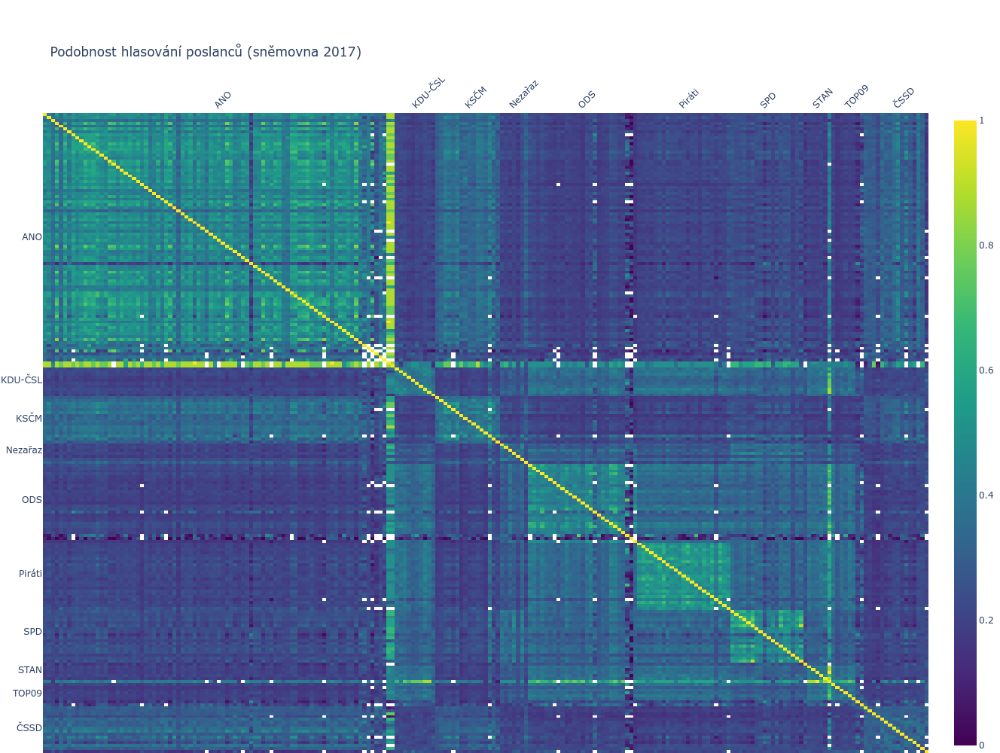

In [60]:
fig = go.Figure(data=go.Heatmap(
        z=pd.DataFrame(matice_poslanci),
        x=osoby.id_osoba.values,
        y=osoby.id_osoba.values,
        text=text,
        colorscale='Viridis',
        hovertemplate="%{text}<extra></extra>"
))

fig.update_layout(
    title=f"Podobnost hlasování poslanců (sněmovna {hp.volebni_obdobi})", 
    width=1000,
    height=1000,
    autosize=False,
    margin=dict(t=150, b=0, l=0, r=0),
    template="plotly_white",
)
fig.update_xaxes(
        type='category', tickangle=-45,
        side='top',
        tickmode='array', ticktext=osoby[osoby.je_uprostred].zkratka_klub, tickvals=osoby[osoby.je_uprostred].id_osoba,
        showspikes=True,
        spikemode='toaxis'
)
fig.update_yaxes(
    type='category', autorange='reversed',
    tickmode='array', ticktext=osoby[osoby.je_uprostred].zkratka_klub, tickvals=osoby[osoby.je_uprostred].id_osoba,
    showspikes=True,
    spikemode='toaxis'
)
fig.show()

## Podobnost hlasování dle poslaneckého klubu

In [35]:
matice_kluby = {}
for id_osoba1, values in matice_poslanci.items():
    klub1 = osoby.loc[id_osoba1].zkratka_klub
    if klub1 not in matice_kluby:
        matice_kluby[klub1] = {}
    for id_osoba2, podobnost in values.items():
        klub2 = osoby.loc[id_osoba2].zkratka_klub
        if klub2 not in matice_kluby[klub1]:
            matice_kluby[klub1][klub2] = []
        if pd.isna(podobnost) == False:
            matice_kluby[klub1][klub2].append(podobnost)

matice_kluby_median = pd.DataFrame({ klub1: {klub2: 100*np.median(ary) for klub2, ary in values.items()} for klub1, values in matice_kluby.items()})
matice_kluby_prumer = pd.DataFrame({ klub1: {klub2: 100*np.mean(ary) for klub2, ary in values.items()} for klub1, values in matice_kluby.items()})

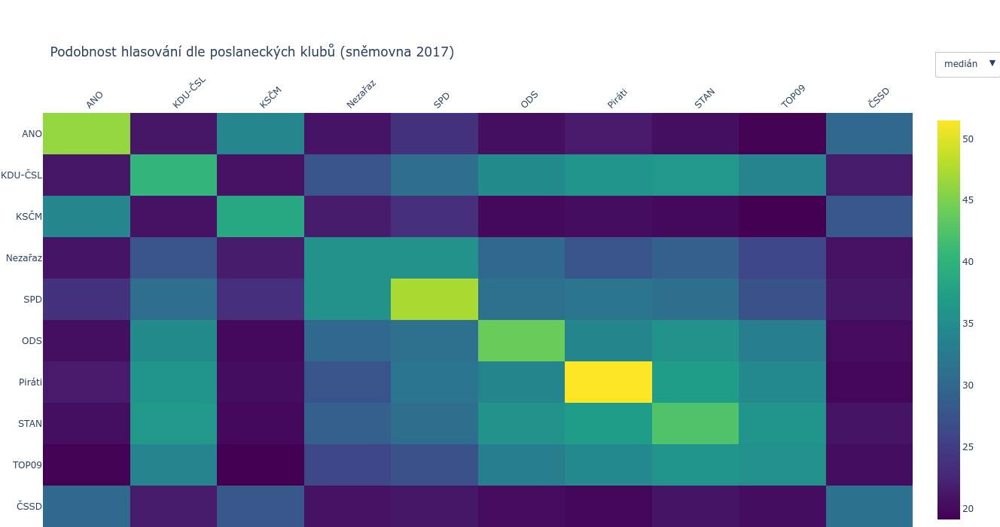

In [57]:
fig = go.Figure(data=go.Heatmap(
        z=matice_kluby_median,
        x=list(matice_kluby_prumer.keys()),
        y=list(matice_kluby_prumer.keys()),
        colorscale='Viridis',
        hovertemplate="%{x}, %{y}<br>Podobnost hlasování: %{z:.2f}%<extra></extra>"
))
fig.update_layout(
    title=f"Podobnost hlasování dle poslaneckých klubů (sněmovna {hp.volebni_obdobi})",
    width=700,
    height=700,
    autosize=False,
    margin=dict(t=150, b=0, l=0, r=0),
    template="plotly_white",
)
fig.update_xaxes(
    type='category', tickangle=-45,
    side='top',
)
fig.update_yaxes(
    type='category', autorange='reversed',
)

updatemenus = [{
    'buttons': [
        {'method': 'update', 'label': 'medián', 'args': [{'z': [matice_kluby_median.values]}]},
        {'method': 'update', 'label': 'průměr', 'args': [{'z': [matice_kluby_prumer.values]}]},
    ],
    'direction': 'down',
    'showactive': True,
    'x': 1.1, 'xanchor': 'right', 'y': 1.15, 'yanchor': 'top',
}]

# update layout with buttons, and show the figure
fig.update_layout(updatemenus=updatemenus)

fig.show()

In [37]:
print(f"Poslední běh notebooku: {datetime.now().strftime('%d.%m.%Y %H:%M:%S')}.")

Poslední běh notebooku: 23.03.2021 21:58:57.
